<a href="https://colab.research.google.com/github/ezemaudet/Trabajo-Final-CV/blob/main/Ultimo_Trabajo_Final_CNN_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Style Transfer

<img src="https://i0.wp.com/chelseatroy.com/wp-content/uploads/2018/12/neural_style_transfer.png?resize=768%2C311&ssl=1">

La idea de este trabajo final es reproducir el siguiente paper:

https://arxiv.org/pdf/1508.06576.pdf

El objetivo es transferir el estilo de una imagen dada a otra imagen distinta.

Como hemos visto en clase, las primeras capas de una red convolucional se activan ante la presencia de ciertos patrones vinculados a detalles muy pequeños.

A medida que avanzamos en las distintas capas de una red neuronal convolucional, los filtros se van activando a medida que detectan patrones de formas cada vez mas complejos.

Lo que propone este paper es asignarle a la activación de las primeras capas de una red neuronal convolucional (por ejemplo VGG19) la definición del estilo y a la activación de las últimas capas de la red neuronal convolucional, la definición del contenido.

La idea de este paper es, a partir de dos imágenes (una que aporte el estilo y otra que aporte el contenido) analizar cómo es la activación de las primeras capas para la imagen que aporta el estilo y cómo es la activación de las últimas capas de la red convolucional para la imagen que aporta el contenido. A partir de esto se intentará sintetizar una imagen que active los filtros de las primeras capas que se activaron con la imagen que aporta el estilo y los filtros de las últimas capas que se activaron con la imagen que aporta el contenido.

A este procedimiento se lo denomina neural style transfer.

# En este trabajo se deberá leer el paper mencionado y en base a ello, entender la implementación que se muestra a continuación y contestar preguntas sobre la misma.

# Una metodología posible es hacer una lectura rápida del paper (aunque esto signifique no entender algunos detalles del mismo) y luego ir analizando el código y respondiendo las preguntas. A medida que se planteen las preguntas, volviendo a leer secciones específicas del paper terminará de entender los detalles que pudieran haber quedado pendientes.

Lo primero que haremos es cargar dos imágenes, una que aporte el estilo y otra que aporte el contenido. A tal fin utilizaremos imágenes disponibles en la web.

In [1]:
# Imagen para estilo
!wget https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg

# Imagen para contenido
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg

# Creamos el directorio para los archivos de salida
!mkdir /content/output

--2023-08-10 03:13:15--  https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 223725 (218K) [image/jpeg]
Saving to: ‘La_noche_estrellada1.jpg’

La_noche_estrellada 100%[===================>] 218.48K  --.-KB/s    in 0.06s   

2023-08-10 03:13:15 (3.55 MB/s) - ‘La_noche_estrellada1.jpg’ saved [223725/223725]

--2023-08-10 03:13:15--  https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 153015 (149K) [image/j

In [2]:
import tensorflow._api.v2.compat.v1 as tf
tf.compat.v1.disable_eager_execution()

In [3]:
from tensorflow.keras.preprocessing.image import load_img, save_img, img_to_array
import numpy as np
from scipy.optimize import fmin_l_bfgs_b
import time
import argparse

from tensorflow.keras.applications import vgg19
from tensorflow.keras import backend as K
from pathlib import Path

In [4]:
# Definimos las imagenes que vamos a utilizar, y el directorio de salida

base_image_path = Path("/content/775px-Neckarfront_Tübingen_Mai_2017.jpg")
style_reference_image_path = Path("/content/La_noche_estrellada1.jpg")
result_prefix = Path("/content/output")
iterations = 25

# 1) En base a lo visto en el paper ¿Qué significan los parámetros definidos en la siguiente celda?

Respuesta:
total_variation_weight = es la variacion de los pesos totales que este dentro de un rango en este caso 0.1 es 10%

style_weight = es un coeficiente donde lo divide por la cant de feature layers para darle importancia al estilo. La relacion entre el styleweight y las capas de las layers da un coeficiente mayor o menor que uno dependiendo de si queremos que aprenda mas estilo o menos estilo.
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(feature_layers)) * sl
loss = loss + total_variation_weight * total_variation_loss(combination_image)

content_weight = Es el coeficiente que le pongo para ponerle cuanto me importa el contenido.1 es el 100% y si quiero que le de menos importancia al contenido le pongo menos de 1.
loss = loss + content_weight * content_loss(base_image_features,                                       combination_features)

Los hiperparámetros que mencionaste son comúnmente utilizados en algoritmos de generación de imágenes mediante transferencia de estilo para controlar el equilibrio entre diferentes componentes de la función de pérdida. Aquí tienes una breve explicación de cada hiperparámetro:

total_variation_weight: Este hiperparámetro controla el peso asignado al término de regularización de variación total en la función de pérdida. La regularización de variación total fomenta la suavidad en la imagen generada penalizando los cambios rápidos en los valores de píxeles. Un valor más alto para total_variation_weight promueve imágenes más suaves, mientras que un valor más bajo permite texturas más detalladas pero puede resultar en salidas con más ruido.

style_weight: Este hiperparámetro determina el peso asignado al componente de pérdida de estilo en la función de pérdida. La pérdida de estilo mide la diferencia en características de estilo entre la imagen generada y la(s) imagen(es) de referencia de estilo. Un valor más alto de style_weight pone más énfasis en capturar el estilo de la imagen de referencia de estilo, lo que resulta en que la imagen generada se asemeje más al estilo artístico de referencia.

content_weight: Este hiperparámetro establece el peso para el componente de pérdida de contenido en la función de pérdida. La pérdida de contenido mide la diferencia en características de contenido entre la imagen generada y la imagen de referencia de contenido. Un valor más alto de content_weight otorga más importancia a preservar el contenido de la imagen de referencia, lo que conduce a que la imagen generada se asemeje más al contenido de referencia.

Ajustando estos hiperparámetros, puedes afinar el equilibrio entre la preservación del estilo, la preservación del contenido y la suavidad en la imagen generada final. Los valores óptimos para estos hiperparámetros dependen de la tarea específica de transferencia de estilo y el efecto artístico deseado. A menudo se requiere experimentación e inspección visual para encontrar el equilibrio adecuado.


In [5]:
total_variation_weight = 0.1
style_weight = 10
content_weight = 1

In [6]:
# Definimos el tamaño de las imágenes a utilizar
width, height = load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

# 2) Explicar qué hace la siguiente celda. En especial las últimas dos líneas de la función antes del return. ¿Por qué?

Ayuda: https://keras.io/applications/

Respuesta:
Preprocesamiento de la imagen:
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
Carga la imagen y la ajusta a las dimensiones de un target size, nrows y ncols
    img = img_to_array(img)
Convierte la imagen en un aray
    img = np.expand_dims(img, axis=0)
Agrega una dimension mas a la imagen para usarlo como indice.
Indice, ancho, alto, canales

    img = vgg19.preprocess_input(img)
Procesamiento de de la imagen para el modelo vgg19

Los comandos mencionados están relacionados con la preparación de una imagen para su procesamiento en un modelo de red neuronal convolucional basado en VGG19.

img = load_img(image_path, target_size=(img_nrows, img_ncols)): Este comando carga la imagen del archivo ubicado en image_path y la redimensiona al tamaño especificado por target_size (ancho y alto). load_img() es una función de la biblioteca Keras que carga una imagen como un objeto PIL (Python Imaging Library).

img = img_to_array(img): Este comando convierte el objeto de imagen PIL en un array NumPy. img_to_array() es una función de Keras que realiza esta conversión.

img = np.expand_dims(img, axis=0): Este comando agrega una dimensión adicional al array de la imagen. Esto se hace para que el array tenga una forma de (1, altura, ancho, canales) en lugar de (altura, ancho, canales). Es necesario porque los modelos de red neuronal esperan un lote de imágenes como entrada, incluso si solo se proporciona una sola imagen.

img = vgg19.preprocess_input(img): Este comando aplica la preprocesamiento específico para el modelo VGG19 a la imagen. La función preprocess_input() de Keras realiza la normalización de la imagen según los requerimientos del modelo VGG19. Esto incluye la reordenación de los canales de color y la normalización de los valores de píxeles.

In [7]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

# 3) Habiendo comprendido lo que hace la celda anterior, explique de manera muy concisa qué hace la siguiente celda. ¿Qué relación tiene con la celda anterior?

Respuesta:
La función deprocess_image(x) se utiliza para revertir el preprocesamiento aplicado a una imagen con el fin de visualizarla o guardarla.

x = x.reshape((img_nrows, img_ncols, 3)): Este paso reestructura el array x para que tenga la forma adecuada para una imagen, es decir, (img_nrows, img_ncols, 3). Esto se hace para revertir la expansión de dimensiones que se realizó durante el procesamiento de la imagen.

x[:, :, 0] += 103.939, x[:, :, 1] += 116.779, x[:, :, 2] += 123.68: Estas líneas deshacen el ajuste realizado durante el preprocesamiento de la imagen. Se suma el valor correspondiente a cada canal de color (B, G, R) para eliminar la centralización en cero que se aplicó anteriormente.

x = x[:, :, ::-1]: Esta línea realiza la transformación del espacio de color de "BGR" a "RGB". En el preprocesamiento, es común convertir las imágenes a "BGR" para utilizar los pesos preentrenados de los modelos VGG. Aquí se revierte este cambio para obtener la representación en "RGB".

x = np.clip(x, 0, 255).astype('uint8'): Esta línea se utiliza para asegurarse de que los valores de los píxeles estén dentro del rango válido (0-255). Se utiliza la función np.clip() para limitar los valores de los píxeles y astype('uint8') para convertir los valores a enteros sin signo de 8 bits.

In [8]:
def deprocess_image(x):
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [9]:
# get tensor representations of our images
# K.variable convierte un numpy array en un tensor, para
base_image = K.variable(preprocess_image(base_image_path))
style_reference_image = K.variable(preprocess_image(style_reference_image_path))

In [10]:
combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

Aclaración:

La siguiente celda sirve para procesar las tres imagenes (contenido, estilo y salida) en un solo batch.

In [11]:
# combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([base_image,
                              style_reference_image,
                              combination_image], axis=0)

In [12]:
# build the VGG19 network with our 3 images as input
# the model will be loaded with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)
print('Model loaded.')

# get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

80134624/80134624 [==============================] - 1s 0us/step
Model loaded.


# 4) En la siguientes celdas:

- ¿Qué es la matriz de Gram?¿Para qué se usa?
- ¿Por qué se permutan las dimensiones de x?

La matriz de Gram captura los features de una imagen aplanada y se la utiliza para la transferencia de esas features a otra imagen. Basicamente hace el producto punto entre la imagen aplanada y su transpuesta. Basicamente hace un flaten y reacomoda la matriz ya sea permutando y transponiendo para poder lograr hacer el producto punto.

La matriz de Gram es una representación de las correlaciones de características en una imagen. Se utiliza en el contexto de la transferencia de estilo para capturar las características de estilo de una imagen de referencia.

La matriz de Gram se calcula a partir de un tensor de características x, que generalmente es una activación intermedia de una red neuronal convolucional. La matriz de Gram se obtiene al calcular el producto punto entre las características aplanadas y transpuestas. Esto resulta en una matriz que refleja cómo las diferentes características están correlacionadas entre sí en términos de su distribución de activación.

La matriz de Gram se usa en el algoritmo de transferencia de estilo para medir la similitud de estilo entre la imagen generada y la imagen de referencia de estilo. Al minimizar la diferencia entre las matrices de Gram de la imagen generada y la imagen de referencia de estilo, se puede lograr que la imagen generada tenga un estilo similar al de la imagen de referencia.

En cuanto a la permutación de dimensiones en la función gram_matrix(x), se realiza para garantizar que las características se aplanen correctamente y se calculen las correlaciones adecuadas. Al permutar las dimensiones de x usando K.permute_dimensions(x, (2, 0, 1)), se asegura que las características se aplanen en el orden correcto antes de calcular la matriz de Gram. Esta permutación puede depender de la estructura específica de las dimensiones de x en el modelo utilizado.


In [13]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

# 5) Losses:

Explicar qué mide cada una de las losses en las siguientes tres celdas.

Rta:
**style_loss: Mide la loss entre el estilo y la salida.**
La función style_loss(style, combination) calcula la pérdida de estilo entre una imagen de referencia de estilo (style) y una imagen generada (combination) en el contexto de la transferencia de estilo. La pérdida de estilo se basa en la diferencia entre las matrices de Gram de las características de estilo en ambas imágenes.
La pérdida de estilo cuantifica la diferencia en la distribución de características de estilo entre las dos imágenes. Al minimizar esta pérdida durante el proceso de optimización de la transferencia de estilo, se busca lograr que la imagen generada tenga un estilo similar al de la imagen de referencia de estilo.

**content_loss: Mide la loss entre la base que es el contenido y la salida.**
La función content_loss(base, combination) calcula la pérdida de contenido entre una imagen base (base) y una imagen generada (combination) en el contexto de la transferencia de estilo.
Es importante tener en cuenta que esta pérdida de contenido suele combinarse con la pérdida de estilo, y la optimización se realiza para minimizar la suma ponderada de ambas pérdidas. De esta manera, se busca lograr un equilibrio entre preservar el contenido de la imagen base y transferir el estilo de la imagen de referencia de estilo.


**total_variation-loss: Mide la loss de los cambios repentinos.**
La función total_variation_loss(x) calcula la pérdida de variación total de una imagen generada x. Esta pérdida tiene como objetivo promover la suavidad y coherencia en la imagen generada al penalizar los cambios rápidos y bruscos en los valores de los píxeles.
La pérdida de variación total se calcula de la siguiente manera:
Calcula la diferencia cuadrada entre los valores de píxeles adyacentes en la dimensión vertical utilizando la fórmula K.square(x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :]).
Calcula la diferencia cuadrada entre los valores de píxeles adyacentes en la dimensión horizontal utilizando la fórmula K.square(x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :]).
Suma las dos matrices de diferencias calculadas.
Eleva cada elemento de la matriz resultante a la potencia de 1.25 utilizando K.pow().
Suma todos los elementos de la matriz resultante utilizando K.sum().
El resultado de esta pérdida penaliza los cambios bruscos entre los valores de los píxeles adyacentes en la imagen generada, lo que lleva a una imagen final más suave y coherente.
Esta pérdida es comúnmente utilizada en el contexto de la transferencia de estilo junto con las pérdidas de estilo y contenido para equilibrar la conservación del contenido y el estilo, mientras se logra una imagen generada visualmente agradable y coherente.

In [14]:
def style_loss(style, combination):
    assert K.ndim(style) == 3
    assert K.ndim(combination) == 3
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return K.sum(K.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))

In [15]:
def content_loss(base, combination):
    return K.sum(K.square(combination - base))


In [16]:
def total_variation_loss(x):
    assert K.ndim(x) == 4
    a = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
    b = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))


In [17]:
# Armamos la loss total
loss = K.variable(0.0)
layer_features = outputs_dict['block5_conv2']
base_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(base_image_features,
                                            combination_features)

feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
for layer_name in feature_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :]
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(feature_layers)) * sl
loss = loss + total_variation_weight * total_variation_loss(combination_image)

In [18]:
grads = K.gradients(loss, combination_image)

In [19]:

outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([combination_image], outputs)

# 6) Explique el propósito de las siguientes tres celdas. ¿Qué hace la función fmin_l_bfgs_b? ¿En qué se diferencia con la implementación del paper? ¿Se puede utilizar alguna alternativa?

Respuesta:
La función fmin_l_bfgs_b es un método de optimización que se utiliza para minimizar una función en el contexto de la transferencia de estilo. En el código proporcionado, la función fmin_l_bfgs_b se utiliza para iterativamente minimizar una función de pérdida (evaluator.loss) que mide la diferencia entre la imagen generada y el objetivo deseado en términos de estilo y contenido.

Como funciona el  código:

x = preprocess_image(base_image_path): Se carga y preprocesa la imagen base desde la ruta base_image_path. La variable x representa la imagen en su forma preprocesada, que es el punto de partida para la optimización.

El bucle for i in range(iterations): inicia una serie de iteraciones para mejorar la imagen generada.

fmin_l_bfgs_b se llama dentro del bucle para minimizar la función de pérdida evaluator.loss. La función fmin_l_bfgs_b toma como argumentos la función de pérdida a minimizar, el punto inicial de la optimización (x.flatten() en este caso) y la función que calcula los gradientes de la función de pérdida (evaluator.grads).

Durante cada iteración, la función fmin_l_bfgs_b busca el mínimo de la función de pérdida y actualiza la imagen generada (x) para acercarla al objetivo
deseado.

Se guarda la imagen generada después de cada iteración como img. El resultado de cada iteración se guarda como un archivo de imagen.

El proceso se repite hasta que se alcanza el número deseado de iteraciones (iterations).

La idea detrás de este enfoque es que, en cada iteración, la imagen generada se ajusta para minimizar la función de pérdida, lo que lleva a una mejora en la transferencia de estilo a medida que la imagen se aproxima más al objetivo deseado. Cada iteración produce una imagen generada con un estilo más similar al de la imagen de referencia de estilo. La función de pérdida y los gradientes se calculan utilizando un "evaluador" específico que se define fuera del código proporcionado y que contiene las funciones necesarias para evaluar la pérdida y los gradientes.

La diferencia es que en el Paper es que usa VGG-Network (Red neuronal convolucional) que usa filtros convolucionales para aprender las caracteristicas de la imagen y luego usa un reconstructor para reconstruir la imagen y el estilo.
Luego partiendo de un ruido blanco trabaja en reconstruir la imagen y el estilo minimizando las pedidas de cada uno por separado. Calcula perdida y el gradiente del estilo y del contenido por separado. Luego minimisa la perdida total.
En cambio en esta notebook se usa una funcione evaluator que calcula gradiente y perdida a la vez, la alternativa seria hacerlo separado pero seria ineficiente.

Otra diferencia en el paper usa para el contenido de la imagen Conv4.2 y aqui en la notebook se uso la Conv5.2
Se probo en esta notebook Conv4.2 pero no se transferia casi el estilo. No se probo haciendo mas iteraciones para verificar.




In [20]:
def eval_loss_and_grads(x):
    x = x.reshape((1, img_nrows, img_ncols, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
    return loss_value, grad_values

# this Evaluator class makes it possible
# to compute loss and gradients in one pass
# while retrieving them via two separate functions,
# "loss" and "grads". This is done because scipy.optimize
# requires separate functions for loss and gradients,
# but computing them separately would be inefficient.

In [21]:
class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

# 7) Ejecute la siguiente celda y observe las imágenes de salida en cada iteración.

Start of iteration 0
Current loss value: 12356005000.0
Image saved as /content/output/output_at_iteration_0.png
Iteration 0 completed in 20s


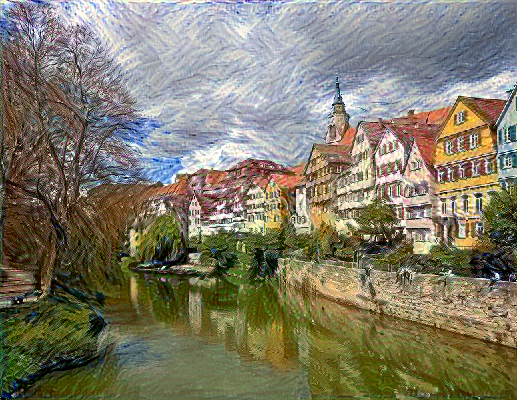

Start of iteration 1
Current loss value: 5857562600.0
Image saved as /content/output/output_at_iteration_1.png
Iteration 1 completed in 7s


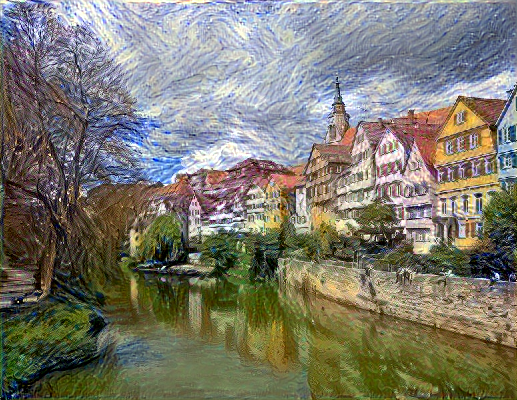

Start of iteration 2
Current loss value: 4019367700.0
Image saved as /content/output/output_at_iteration_2.png
Iteration 2 completed in 7s


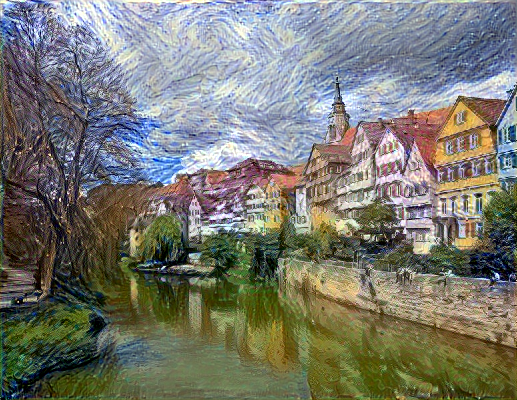

Start of iteration 3
Current loss value: 3086035500.0
Image saved as /content/output/output_at_iteration_3.png
Iteration 3 completed in 7s


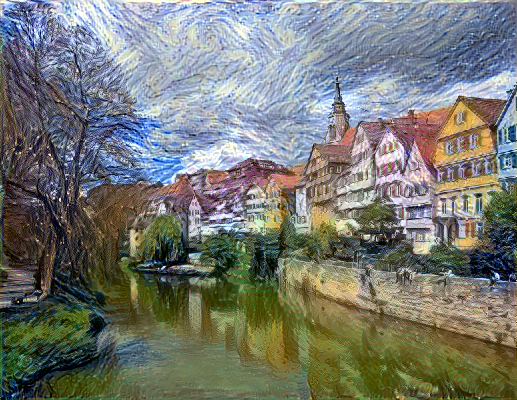

Start of iteration 4
Current loss value: 2611789300.0
Image saved as /content/output/output_at_iteration_4.png
Iteration 4 completed in 7s


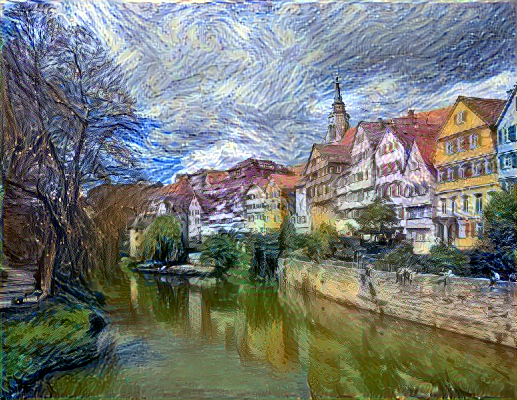

Start of iteration 5
Current loss value: 2286827000.0
Image saved as /content/output/output_at_iteration_5.png
Iteration 5 completed in 7s


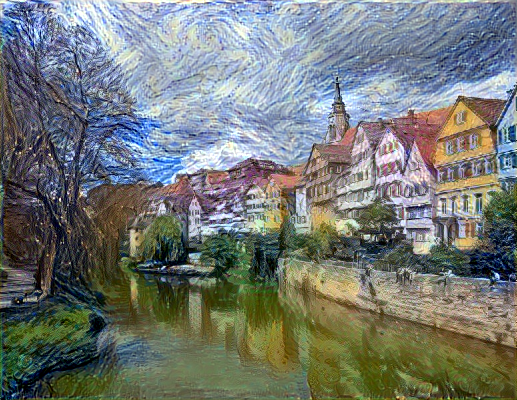

Start of iteration 6
Current loss value: 1961553200.0
Image saved as /content/output/output_at_iteration_6.png
Iteration 6 completed in 7s


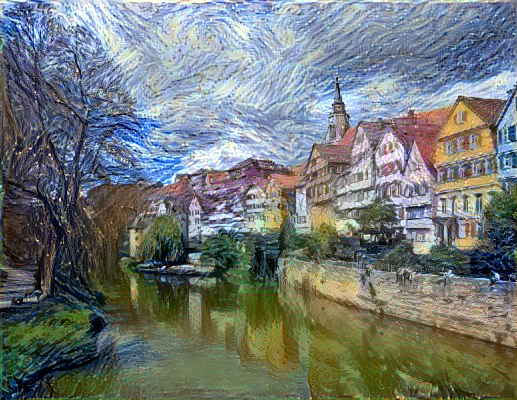

Start of iteration 7
Current loss value: 1791006200.0
Image saved as /content/output/output_at_iteration_7.png
Iteration 7 completed in 7s


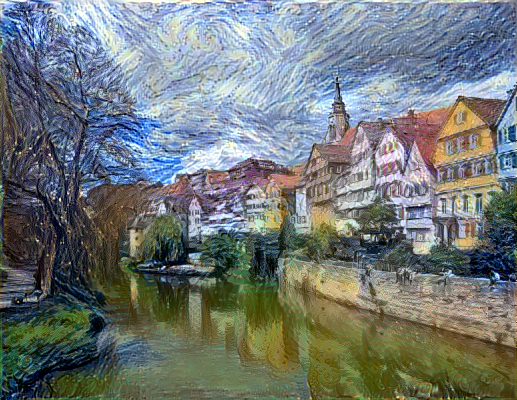

Start of iteration 8
Current loss value: 1695205800.0
Image saved as /content/output/output_at_iteration_8.png
Iteration 8 completed in 7s


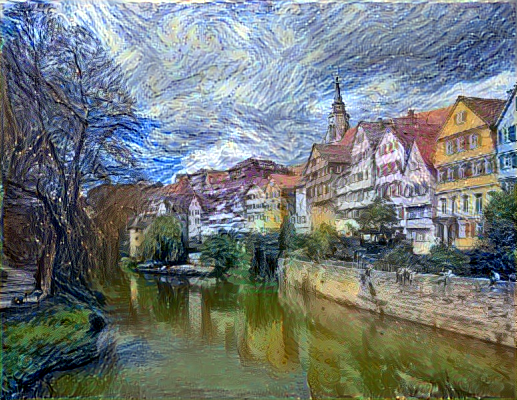

Start of iteration 9
Current loss value: 1623710300.0
Image saved as /content/output/output_at_iteration_9.png
Iteration 9 completed in 7s


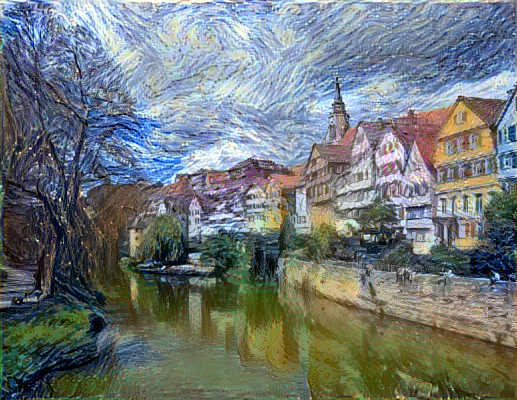

Start of iteration 10
Current loss value: 1565720300.0
Image saved as /content/output/output_at_iteration_10.png
Iteration 10 completed in 7s


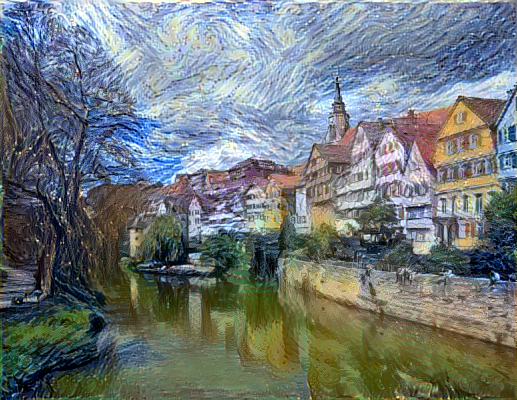

Start of iteration 11
Current loss value: 1460957300.0
Image saved as /content/output/output_at_iteration_11.png
Iteration 11 completed in 7s


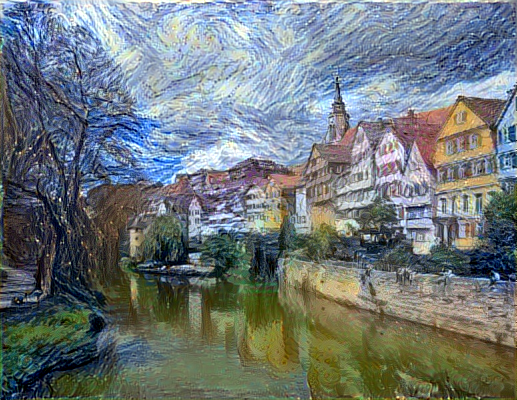

Start of iteration 12
Current loss value: 1396482000.0
Image saved as /content/output/output_at_iteration_12.png
Iteration 12 completed in 7s


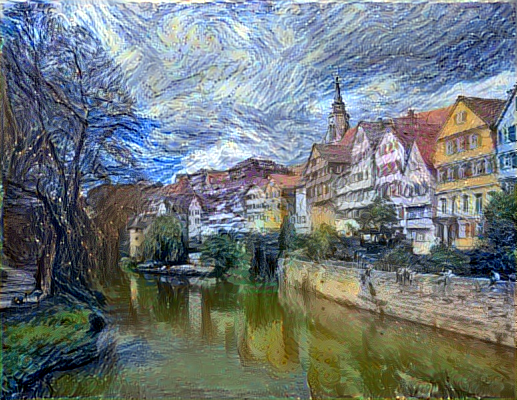

Start of iteration 13
Current loss value: 1354135400.0
Image saved as /content/output/output_at_iteration_13.png
Iteration 13 completed in 7s


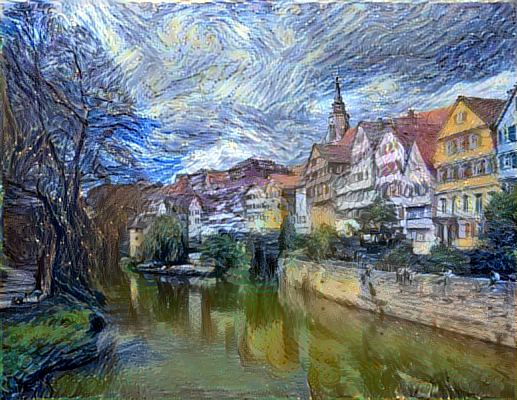

Start of iteration 14
Current loss value: 1314555900.0
Image saved as /content/output/output_at_iteration_14.png
Iteration 14 completed in 8s


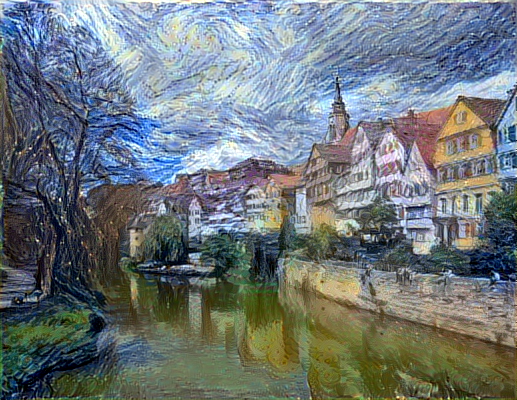

Start of iteration 15
Current loss value: 1285830700.0
Image saved as /content/output/output_at_iteration_15.png
Iteration 15 completed in 7s


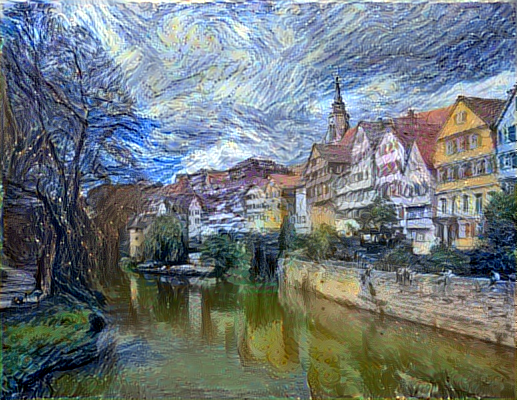

Start of iteration 16
Current loss value: 1263340700.0
Image saved as /content/output/output_at_iteration_16.png
Iteration 16 completed in 7s


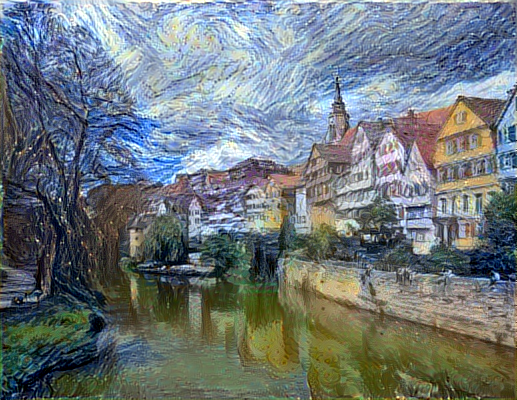

Start of iteration 17
Current loss value: 1233353600.0
Image saved as /content/output/output_at_iteration_17.png
Iteration 17 completed in 7s


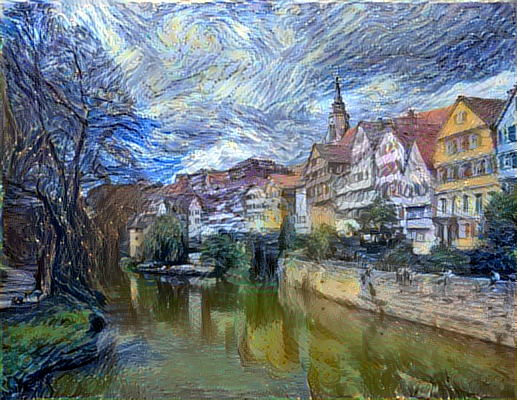

Start of iteration 18
Current loss value: 1211574300.0
Image saved as /content/output/output_at_iteration_18.png
Iteration 18 completed in 7s


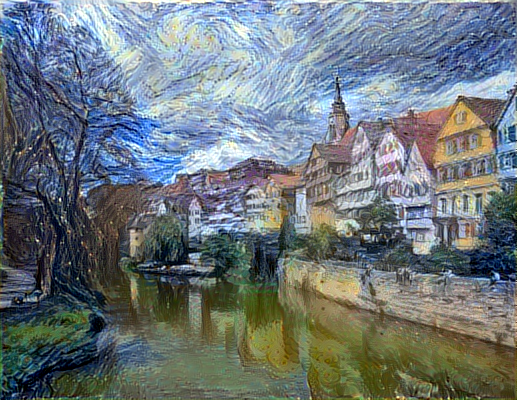

Start of iteration 19
Current loss value: 1188770300.0
Image saved as /content/output/output_at_iteration_19.png
Iteration 19 completed in 8s


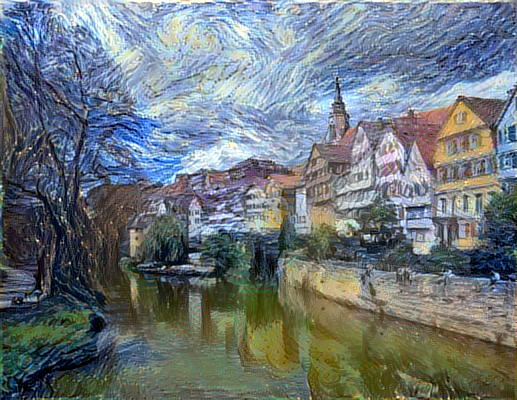

Start of iteration 20
Current loss value: 1170923100.0
Image saved as /content/output/output_at_iteration_20.png
Iteration 20 completed in 7s


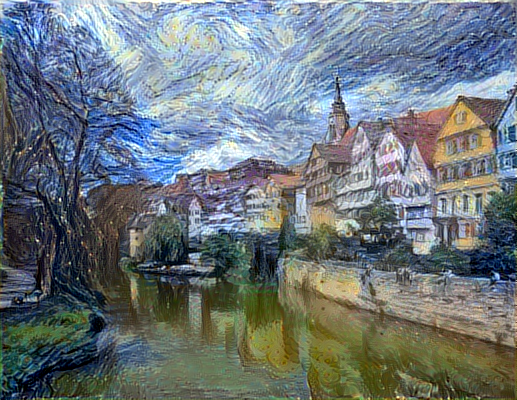

Start of iteration 21
Current loss value: 1156442200.0
Image saved as /content/output/output_at_iteration_21.png
Iteration 21 completed in 7s


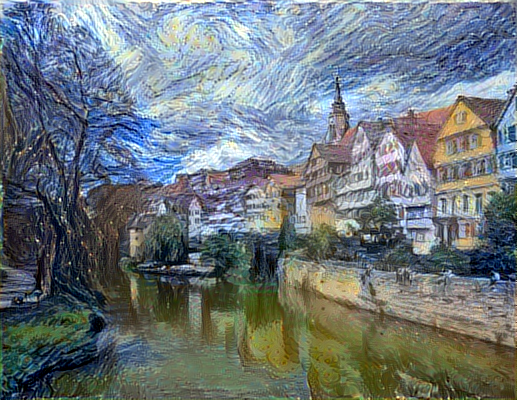

Start of iteration 22
Current loss value: 1146089700.0
Image saved as /content/output/output_at_iteration_22.png
Iteration 22 completed in 7s


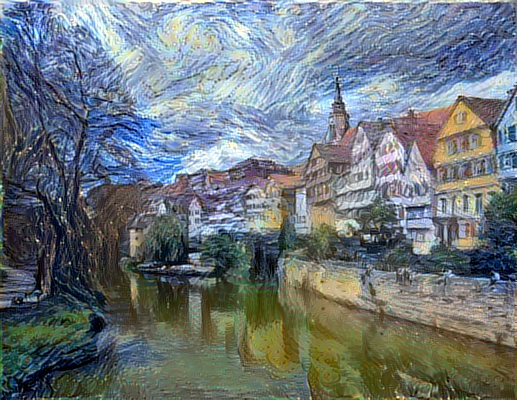

Start of iteration 23
Current loss value: 1138090200.0
Image saved as /content/output/output_at_iteration_23.png
Iteration 23 completed in 7s


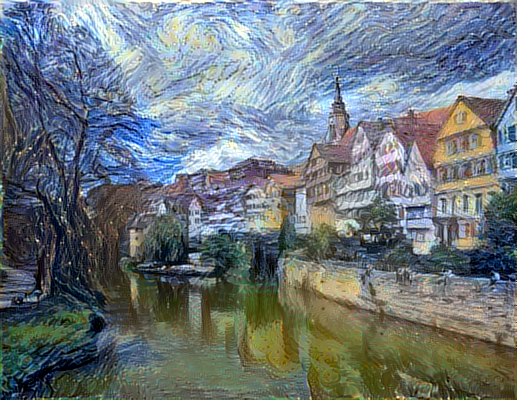

Start of iteration 24
Current loss value: 1126957800.0
Image saved as /content/output/output_at_iteration_24.png
Iteration 24 completed in 8s


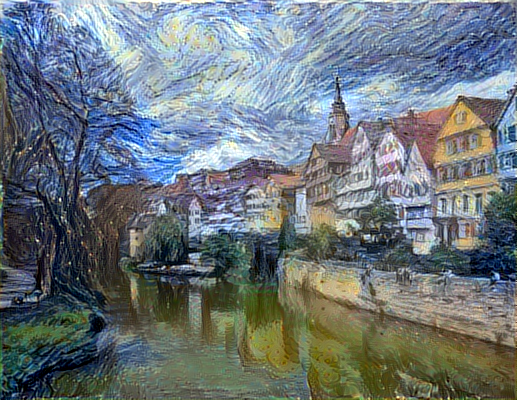

In [22]:
from IPython.display import Image, display
evaluator = Evaluator()

# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
x = preprocess_image(base_image_path)

for i in range(iterations):
    print('Start of iteration', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=20)
    print('Current loss value:', min_val)
    # save current generated image
    img = deprocess_image(x.copy())
    fname = result_prefix / ('output_at_iteration_%d.png' % i)
    save_img(fname, img)
    end_time = time.time()
    print('Image saved as', fname)
    print('Iteration %d completed in %ds' % (i, end_time - start_time))
    display(Image(filename=fname))

# 8) Generar imágenes para distintas combinaciones de pesos de las losses. Explicar las diferencias. (Adjuntar las imágenes generadas como archivos separados.)

Respuesta: Ver respuesta 9


# 9) Cambiar las imágenes de contenido y estilo por unas elegidas por usted. Adjuntar el resultado.

Respuesta:
La variación de los pesos hacen cambios sutiles en el resultado final. Se pueden apreciar cambios haciendo cambios del orden a la 10 para percibir los cambios. Igualmente son sutiles. Funciona bien cuando la imagen del estilo es una imagen uniforme y con angulos rectos performa mejor a cuando el estilo tiene formas circulares.
Ver archivo enviado por email o hacer clic en siguiente link.
https://docs.google.com/presentation/d/107idgZqLxS4tn0eGz3de93UUvO6mDb-5OSUh4RbtSJ4/edit?usp=sharing